In [1]:
!pip3 install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121

Looking in indexes: https://download.pytorch.org/whl/cu121


In [2]:
!nvidia-smi

Fri Apr 26 09:00:29 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 552.12                 Driver Version: 552.12         CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                     TCC/WDDM  | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce GTX 1080      WDDM  |   00000000:01:00.0  On |                  N/A |
|  0%   50C    P0             57W /  240W |     861MiB /   8192MiB |     10%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [3]:
pip install torch

In [4]:
import torch

if torch.cuda.is_available():
    device = torch.device("cuda")
    print("GPU is available")
    print("GPU Device Name:", torch.cuda.get_device_name(0))  # Get the name of the GPU device
else:
    print("GPU is not available. Running on CPU.")
    device = torch.device("cpu")


GPU is available
GPU Device Name: NVIDIA GeForce GTX 1080


In [5]:
pip install pandas

Note: you may need to restart the kernel to use updated packages.


In [6]:
pip install opencv-python

In [7]:
pip install ultralytics

Note: you may need to restart the kernel to use updated packages.


In [8]:
pip install torch

Note: you may need to restart the kernel to use updated packages.


In [9]:
import os
import time
import json
import requests
from zipfile import ZipFile
import tarfile
from shutil import copyfile
from dataclasses import dataclass, field
import yaml
import glob
import random
import numpy as np
import pandas as pd
import cv2
from ultralytics import YOLO
import matplotlib.pyplot as plt

In [10]:

IMAGES_DIR = "images"
ANNS_METADATA = "keypoint_definitions.csv"
if not os.path.exists(IMAGES_DIR):
    print("Images directory not found. Please provide the correct path.")
else:
    print("Images directory found.")

# Check if the annotation metadata file exists
if not os.path.isfile(ANNS_METADATA):
    print("Annotation metadata file not found. Please provide the correct path.")
else:
    print("Annotation metadata file found.")


Images directory found.
Annotation metadata file found.


In [11]:
JSON_PATH = "noPath_final.json"

with open(JSON_PATH) as file:
    json_data = json.load(file)


In [12]:
train_ids = np.load("indices/train_indices.npy")
val_ids = np.load("indices/test_indices.npy")

print(f"Train Samples: {len(train_ids)}")
print(f"Validation Samples: {len(val_ids)}")

Train Samples: 427
Validation Samples: 53


In [13]:
DATA_DIR = "animal-pose-data"

TRAIN_DIR         = f"train"
TRAIN_FOLDER_IMG    = f"images"
TRAIN_FOLDER_LABELS = f"labels"

TRAIN_IMG_PATH   = os.path.join(DATA_DIR, TRAIN_DIR, TRAIN_FOLDER_IMG)
TRAIN_LABEL_PATH = os.path.join(DATA_DIR, TRAIN_DIR, TRAIN_FOLDER_LABELS)

VALID_DIR           = f"valid"
VALID_FOLDER_IMG    = f"images"
VALID_FOLDER_LABELS = f"labels"

VALID_IMG_PATH   = os.path.join(DATA_DIR, VALID_DIR, VALID_FOLDER_IMG)
VALID_LABEL_PATH = os.path.join(DATA_DIR, VALID_DIR, VALID_FOLDER_LABELS)

os.makedirs(TRAIN_IMG_PATH, exist_ok=True)
os.makedirs(TRAIN_LABEL_PATH, exist_ok=True)
os.makedirs(VALID_IMG_PATH, exist_ok=True)
os.makedirs(VALID_LABEL_PATH, exist_ok=True)

In [14]:
train_json_data = []
for train_id in train_ids:
    train_json_data.append(json_data[train_id])

val_json_data = []
for val_id in val_ids:
    val_json_data.append(json_data[val_id])


In [15]:
for data in train_json_data:
    img_file = data["img_path"]
    filename = img_file.split("/")[-1]
    copyfile(os.path.join(IMAGES_DIR, img_file),
             os.path.join(TRAIN_IMG_PATH, filename))


for data in val_json_data:
    img_file = data["img_path"]
    filename = img_file.split("/")[-1]
    copyfile(os.path.join(IMAGES_DIR, img_file),
             os.path.join(VALID_IMG_PATH, filename))

In [16]:
CLASS_ID = 0

In [17]:
def create_yolo_boxes_kpts(img_size, boxes, lm_kpts):
    IMG_W, IMG_H = img_size
    norm_bbox_per_img = boxes / np.array([IMG_W, IMG_H, IMG_W, IMG_H])
    norm_kps_per_img = lm_kpts.copy()
    norm_kps_per_img[:, :, :-1] /= np.array([IMG_W, IMG_H])
    yolo_data = []
    for i in range(len(boxes)):
        yolo_data.append("0")  # Class Label
        # Bounding Box Coordinates
        bbox = norm_bbox_per_img[i]
        yolo_data.append(f" {bbox[0]:.6f} {bbox[1]:.6f} {bbox[2]:.6f} {bbox[3]:.6f}")
        for kpt in norm_kps_per_img[i]:
            for coord in kpt[:-1]:
                yolo_data.append(f" {coord:.6f}")
            visibility = "2" if kpt[-1] != 0 else "0"
            yolo_data.append(f" {visibility}")
        if i < len(boxes) - 1:
            yolo_data.append("\n")
    return "".join(yolo_data)

def create_yolo_txt_files(json_data, LABEL_PATH):
    for data in json_data:
        IMAGE_ID = data["img_path"].split("/")[-1].split(".")[0]
        IMG_WIDTH, IMG_HEIGHT = data["img_width"], data["img_height"]
        landmark_kpts = np.nan_to_num(np.array(data["img_joints"], dtype=np.float32))
        landmarks_bboxes = np.array(data["img_boxes"], dtype=np.float32)

        yolo_data = create_yolo_boxes_kpts((IMG_WIDTH, IMG_HEIGHT), landmarks_bboxes, landmark_kpts)

        TXT_FILE = IMAGE_ID + ".txt"
        with open(os.path.join(LABEL_PATH, TXT_FILE), "w") as f:
            f.write(yolo_data)

create_yolo_txt_files(train_json_data, TRAIN_LABEL_PATH)
create_yolo_txt_files(val_json_data, VALID_LABEL_PATH)


In [18]:

ann_meta_data = pd.read_csv("keypoint_definitions.csv")
COLORS = ann_meta_data["Hex colour"].values.tolist()
def hex_to_rgb(hex_color):
    if hex_color.startswith('#'):
        hex_color = hex_color[1:]
    return tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))
COLORS_RGB_MAP = [{color: hex_to_rgb(color)} for color in COLORS]


In [19]:
train_images = os.listdir(TRAIN_IMG_PATH)#animal-pose-data/train/images
valid_images = os.listdir(VALID_IMG_PATH)#animal-pose-data/valid/images

print(f"Training images: {len(train_images)}, Validation Images: {len(valid_images)}")

Training images: 427, Validation Images: 53


In [20]:
def draw_landmarks(image, landmarks):

    radius = 5
    if (image.shape[1] > 1000):
        radius = 8

    for idx, kpt_data in enumerate(landmarks):

        loc_x, loc_y = kpt_data[:2].astype("int").tolist()
        color_id = list(COLORS_RGB_MAP[int(kpt_data[-1])].values())[0]

        cv2.circle(image,
                   (loc_x, loc_y),
                   radius,
                   color=color_id[::-1],
                   thickness=-1,
                   lineType=cv2.LINE_AA)

    return image

In [21]:
def draw_boxes(image, detections, class_name = "Cow", score=None, color=(0,255,0)):

    font_size = 0.25 + 0.07 * min(image.shape[:2]) / 100
    font_size = max(font_size, 0.5)
    font_size = min(font_size, 0.8)
    text_offset = 3

    thickness = 2
    if (image.shape[1] > 1000):
        thickness = 10

    xmin, ymin, xmax, ymax = detections[:4].astype("int").tolist()
    conf = round(float(detections[-1]),2)
    cv2.rectangle(image,
                  (xmin, ymin),
                  (xmax, ymax),
                  color=(0,255,0),
                  thickness=thickness,
                  lineType=cv2.LINE_AA)

    display_text = f"{class_name}"

    if score is not None:
        display_text+=f": {score:.2f}"

    (text_width, text_height), _ = cv2.getTextSize(display_text,
                                                   cv2.FONT_HERSHEY_SIMPLEX,
                                                   font_size, 2)

    cv2.rectangle(image,
                      (xmin, ymin),
                      (xmin + text_width + text_offset, ymin - text_height - int(15 * font_size)),
                      color=color, thickness=-1)

    image = cv2.putText(
                    image,
                    display_text,
                    (xmin + text_offset, ymin - int(10 * font_size)),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    font_size,
                    (0, 0, 0),
                    2, lineType=cv2.LINE_AA,
                )

    return image

In [22]:
def visualize_annotations(image, boxes, keypoints):
    print("Inside visualize_annotations function")
    # Draw bounding boxes
    for idx, box in enumerate(boxes):
        xmin, ymin, xmax, ymax = box
        print(f"Bounding Box {idx + 1} Coordinates: {xmin} {ymin} {xmax} {ymax}")
        cv2.rectangle(image, (int(xmin * image.shape[1]), int(ymin * image.shape[0])),
                      (int(xmax * image.shape[1]), int(ymax * image.shape[0])),
                      (0, 255, 0), 2)
    print("Bounding boxes drawn successfully")

    for instance_kpts in keypoints:
        print("Processing keypoints for an instance")
        if instance_kpts.any():
            for kpt_data in instance_kpts:
                print("KeyPoint Data:", kpt_data)
                if len(kpt_data) >= 2:
                    x, y = kpt_data[:2]
                    loc_x, loc_y = int(x * image.shape[1]), int(y * image.shape[0])
                    cv2.circle(image, (loc_x, loc_y), 3, (0, 255, 0), -1)  # Default color (green)
                    print("Keypoint drawn")
                else:
                    print("Insufficient data in kpt_data")
        else:
            print("No keypoints data available for this instance")

    print("Annotations drawn successfully")
    return image

In [23]:
pip install tensorflow

Note: you may need to restart the kernel to use updated packages.


Processing image 1 out of 8
Shape of instance_kpts: (1, 14, 2)
Inside visualize_annotations function
Bounding Box 1 Coordinates: 0.023333000019192696 0.05084700137376785 0.949999988079071 0.9593219757080078
Bounding boxes drawn successfully
Processing keypoints for an instance
KeyPoint Data: [    0.56333     0.34576]
Keypoint drawn
KeyPoint Data: [       0.25      0.2678]
Keypoint drawn
KeyPoint Data: [    0.46667     0.48136]
Keypoint drawn
KeyPoint Data: [       0.63     0.37288]
Keypoint drawn
KeyPoint Data: [       0.15     0.29491]
Keypoint drawn
KeyPoint Data: [       0.55     0.74576]
Keypoint drawn
KeyPoint Data: [        0.9     0.59322]
Keypoint drawn
KeyPoint Data: [    0.49667     0.88136]
Keypoint drawn
KeyPoint Data: [       0.85     0.71864]
Keypoint drawn
KeyPoint Data: [        0.8     0.71525]
Keypoint drawn
KeyPoint Data: [    0.81667     0.82034]
Keypoint drawn
KeyPoint Data: [    0.76667     0.77966]
Keypoint drawn
KeyPoint Data: [    0.42667     0.71864]
Keypoint 

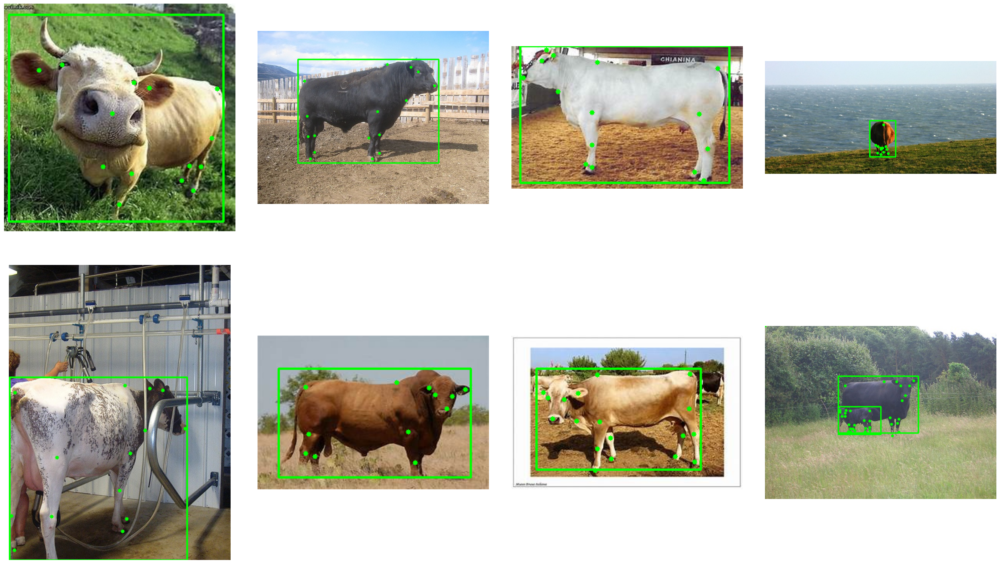

In [24]:
from tensorflow.keras.preprocessing.sequence import pad_sequences

IMAGE_FILES = os.listdir(TRAIN_IMG_PATH)
NUM_LANDMARKS = 20

num_samples = 8
num_rows = 2
num_cols = num_samples//num_rows

fig, ax = plt.subplots(
        nrows=num_rows,
        ncols=num_cols,
        figsize=(25, 15),
    )

random.seed(45)
random.shuffle(IMAGE_FILES)

for idx, (file, axis) in enumerate(zip(IMAGE_FILES[:num_samples], ax.flat)):
    print(f"Processing image {idx + 1} out of {num_samples}")
    image = cv2.imread(os.path.join(TRAIN_IMG_PATH, file))
    filename = file.split(".")[0]
    with open(os.path.join(TRAIN_LABEL_PATH, filename+".txt"), "r") as file:
        label_data = [x.split() for x in file.read().strip().splitlines() if len(x)]
    label_data = np.array(label_data, dtype=np.float32)
    box_instances = label_data[:, 1:5]
    instance_kpts = []
    max_length = 0
    for inst_kpt in label_data[:, 5:]:

        keypoints = np.array_split(inst_kpt, len(inst_kpt) // 3)
        vis_kpts = []
        for keypoint in keypoints:
            if keypoint[-1] > 0.:
                vis_kpts.append(keypoint[:-1])  # Exclude visibility flag
        vis_kpts_padded = pad_sequences(vis_kpts, padding='post', dtype='float32')
        max_length = max(max_length, vis_kpts_padded.shape[0])
        instance_kpts.append(vis_kpts_padded)


    for idx, kpts in enumerate(instance_kpts):
        instance_kpts[idx] = np.pad(kpts, ((0, max_length - kpts.shape[0]), (0, 0)), mode='constant')

    instance_kpts = np.array(instance_kpts)
    print("Shape of instance_kpts:", instance_kpts.shape)  # Debugging output
    image_ann = visualize_annotations(image, box_instances, instance_kpts)
    axis.imshow(image_ann[..., ::-1])
    axis.axis("off")

plt.tight_layout(h_pad=4., w_pad=4.)
plt.show()

In [25]:
@dataclass(frozen=True)
class TrainingConfig:
    DATASET_YAML:   str = "animal-keypoints.yaml"
    MODEL:          str = "yolov8m-pose.pt"
    EPOCHS:         int = 2
    KPT_SHAPE:    tuple = (20,3)
    PROJECT:        str = "Animal_Keypoints"
    NAME:           str = f"{MODEL.split('.')[0]}_{EPOCHS}_epochs"
    CLASSES_DICT:  dict = field(default_factory = lambda:{0 : "cow"})

In [26]:
@dataclass(frozen=True)
class DatasetConfig:
    IMAGE_SIZE:    int   = 640
    BATCH_SIZE:    int   = 16
    CLOSE_MOSAIC:  int   = 10
    MOSAIC:        float = 0.4
    FLIP_LR:       float = 0.0 # Turn off horizontal flip.

In [27]:
train_config = TrainingConfig()
data_config = DatasetConfig()

In [28]:
current_dir = os.getcwd()

data_dict = dict(
                path      = os.path.join(current_dir, DATA_DIR),
                train     = os.path.join(TRAIN_DIR, TRAIN_FOLDER_IMG),
                val       = os.path.join(VALID_DIR, VALID_FOLDER_IMG),
                names     = train_config.CLASSES_DICT,
                kpt_shape = list(train_config.KPT_SHAPE),
               )

with open(train_config.DATASET_YAML, "w") as config_file:
    yaml.dump(data_dict, config_file)

In [29]:
pose_model = model = YOLO(train_config.MODEL)

pose_model.train(data    = train_config.DATASET_YAML,
            epochs       = train_config.EPOCHS,
            imgsz        = data_config.IMAGE_SIZE,
            batch        = data_config.BATCH_SIZE,
            project      = train_config.PROJECT,
            name         = train_config.NAME,
            close_mosaic = data_config.CLOSE_MOSAIC,
            mosaic       = data_config.MOSAIC,
            fliplr       = data_config.FLIP_LR
           )

New https://pypi.org/project/ultralytics/8.2.2 available  Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.1.47  Python-3.11.8 torch-2.2.2+cu121 CUDA:0 (NVIDIA GeForce GTX 1080, 8192MiB)
engine\trainer: task=pose, mode=train, model=yolov8m-pose.pt, data=animal-keypoints.yaml, epochs=2, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=Animal_Keypoints, name=yolov8m-pose_2_epochs, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=Fal

train: Scanning C:\Users\jorge\PostureEstimation\Cow\animal-pose-data\train\labels.cache... 427 images, 0 backgrounds, 2 corrupt: 100%|██████████| 427/427 [00:00<?, ?it/s]

train: WARNING  C:\Users\jorge\PostureEstimation\Cow\animal-pose-data\train\images\2011_000566.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0169]
train: WARNING  C:\Users\jorge\PostureEstimation\Cow\animal-pose-data\train\images\2011_003043.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0028]



val: Scanning C:\Users\jorge\PostureEstimation\Cow\animal-pose-data\valid\labels.cache... 53 images, 0 backgrounds, 0 corrupt: 100%|██████████| 53/53 [00:00<?, ?it/s]


Plotting labels to Animal_Keypoints\yolov8m-pose_2_epochs\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 83 weight(decay=0.0), 93 weight(decay=0.0005), 92 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to Animal_Keypoints\yolov8m-pose_2_epochs
Starting training for 2 epochs...

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


        1/2      8.61G      2.408      9.727     0.6994      3.182      2.822         25        640: 100%|██████████| 27/27 [01:34<00:00,  3.49s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.40s/it]

                   all         53        107      0.268      0.477      0.198      0.073   0.000365     0.0187   0.000189   7.49e-05



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


        2/2      9.15G      2.035      9.281     0.6917      2.039       2.46         18        640: 100%|██████████| 27/27 [02:33<00:00,  5.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.63s/it]

                   all         53        107      0.432      0.421      0.338      0.102    0.00104      0.028   0.000351   0.000148



2 epochs completed in 0.075 hours.
Optimizer stripped from Animal_Keypoints\yolov8m-pose_2_epochs\weights\last.pt, 53.5MB
Optimizer stripped from Animal_Keypoints\yolov8m-pose_2_epochs\weights\best.pt, 53.5MB

Validating Animal_Keypoints\yolov8m-pose_2_epochs\weights\best.pt...
Ultralytics YOLOv8.1.47  Python-3.11.8 torch-2.2.2+cu121 CUDA:0 (NVIDIA GeForce GTX 1080, 8192MiB)
YOLOv8m-pose summary (fused): 237 layers, 26570959 parameters, 0 gradients, 81.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.02s/it]


                   all         53        107      0.432      0.421      0.335      0.103    0.00104      0.028   0.000351   0.000148
Speed: 0.3ms preprocess, 21.7ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to Animal_Keypoints\yolov8m-pose_2_epochs


ultralytics.utils.metrics.PoseMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001568AF4A550>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(P)', 'F1-Confidence(P)', 'Precision-Confidence(P)', 'Recall-Confidence(P)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,

In [30]:
ckpt_path  = os.path.join(train_config.PROJECT, train_config.NAME, "weights", "best.pt")
model_pose = YOLO(ckpt_path)

metrics = model_pose.val()

Ultralytics YOLOv8.1.47  Python-3.11.8 torch-2.2.2+cu121 CUDA:0 (NVIDIA GeForce GTX 1080, 8192MiB)
YOLOv8m-pose summary (fused): 237 layers, 26570959 parameters, 0 gradients, 81.5 GFLOPs


val: Scanning C:\Users\jorge\PostureEstimation\Cow\animal-pose-data\valid\labels.cache... 53 images, 0 backgrounds, 0 corrupt: 100%|██████████| 53/53 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:12<00:00,  3.13s/it]


                   all         53        107      0.457      0.402      0.367      0.111    0.00116      0.028    0.00042   0.000172
Speed: 0.8ms preprocess, 26.2ms inference, 0.0ms loss, 4.5ms postprocess per image
Results saved to runs\pose\val3


In [31]:
def prepare_predictions(
    image_dir_path,
    image_filename,
    model,
    BOX_IOU_THRESH = 0.55,
    BOX_CONF_THRESH=0.30,
    KPT_CONF_THRESH=0.68):

    image_path = os.path.join(image_dir_path, image_filename)
    image = cv2.imread(image_path).copy()

    results = model.predict(image_path, conf=BOX_CONF_THRESH, iou=BOX_IOU_THRESH, save = True, save_txt = True)[0].cpu()

    if not len(results.boxes.xyxy):
        return image

    # Get the predicted boxes, conf scores and keypoints.
    pred_boxes = results.boxes.xyxy.numpy()
    pred_box_conf = results.boxes.conf.numpy()
    pred_kpts_xy = results.keypoints.xy.numpy()
    pred_kpts_conf = results.keypoints.conf.numpy()

    # Draw predicted bounding boxes, conf scores and keypoints on image.
    for boxes, score, kpts, confs in zip(pred_boxes, pred_box_conf, pred_kpts_xy, pred_kpts_conf):
        kpts_ids = np.where(confs > KPT_CONF_THRESH)[0]
        filter_kpts = kpts[kpts_ids]
        filter_kpts = np.concatenate([filter_kpts, np.expand_dims(kpts_ids, axis=-1)], axis=-1)
        image = draw_boxes(image, boxes, score=score)
        image = draw_landmarks(image, filter_kpts)

    return image


image 1/1 C:\Users\jorge\PostureEstimation\Cow\animal-pose-data\valid\images\2009_000250.jpg: 448x640 5 cows, 95.7ms
Speed: 2.0ms preprocess, 95.7ms inference, 7.0ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs\pose\predict
1 label saved to runs\pose\predict\labels

image 1/1 C:\Users\jorge\PostureEstimation\Cow\animal-pose-data\valid\images\2010_000063.jpg: 480x640 4 cows, 75.8ms
Speed: 2.0ms preprocess, 75.8ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)
Results saved to runs\pose\predict
2 labels saved to runs\pose\predict\labels

image 1/1 C:\Users\jorge\PostureEstimation\Cow\animal-pose-data\valid\images\2009_001798.jpg: 480x640 3 cows, 15.0ms
Speed: 2.0ms preprocess, 15.0ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)
Results saved to runs\pose\predict
3 labels saved to runs\pose\predict\labels

image 1/1 C:\Users\jorge\PostureEstimation\Cow\animal-pose-data\valid\images\2008_000711.jpg: 448x640 2 cows, 16.0ms
Spee

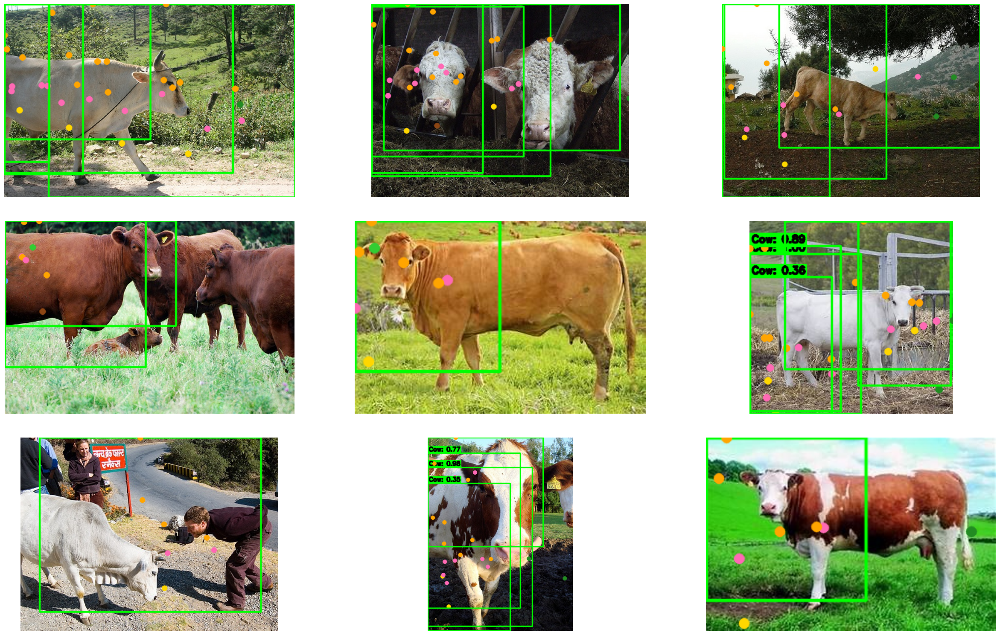

In [32]:
VAL_IMAGE_FILES = os.listdir(VALID_IMG_PATH)

num_samples = 9
num_rows = 3
num_cols = num_samples//num_rows

fig, ax = plt.subplots(
        nrows=num_rows,
        ncols=num_cols,
        figsize=(25, 15),
    )

random.seed(90)
random.shuffle(VAL_IMAGE_FILES)

for idx, (file, axis) in enumerate(zip(VAL_IMAGE_FILES[:num_samples], ax.flat)):

    image_pred= prepare_predictions(VALID_IMG_PATH, file, model_pose)
    axis.imshow(image_pred[...,::-1])
    axis.axis("off")

plt.tight_layout(h_pad=4., w_pad=4.)
plt.show();